In [1]:
import numpy as np
import matplotlib.pyplot as plt

from sklearn import model_selection
from sklearn.datasets import load_iris
from matplotlib.colors import ListedColormap

# Урок 7. Классификация KNN. Кластеризация K-means.

**1. К алгоритму kNN, реализованному на уроке, реализовать добавление весов для соседей по любому из показанных на уроке принципов.**

In [11]:
# Из загруженного датасета берём два признака для анализа.
X, y = load_iris(return_X_y=True)
X = X[:, :2]

X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=0.2, random_state=1)

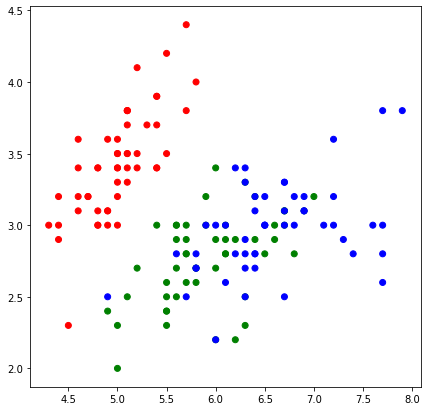

In [4]:
cmap = ListedColormap(['red', 'green', 'blue'])
plt.figure(figsize=(7, 7))
plt.scatter(X[:, 0], X[:, 1], c=y, cmap=cmap)
plt.show()

In [29]:
"""Евклидова метрика расстояния"""
e_metrics = lambda x1, x2: np.sqrt((X[0] - X[1]) @ (X[0] - X[1]))

In [30]:
"""Вычисление веса от расстояния"""
weight = lambda d: 0.5 ** d

In [31]:
"""Метрика точности"""
accuracy = lambda y, pred: sum(pred == y) / len(y)

In [45]:
"""Алгоритм поиска K ближайших соседей"""
def knn(x_train, y_train, x_test, k):
    
    answers = []
    for x in x_test:
        test_distances = []
            
        for i in range(len(x_train)):
            # Расстояние от классифицируемого объекта до объекта из обучающей выборки
            distance = e_metrics(x, x_train[i])
                       
            # Записываем в список значение расстояния и ответа на объекте обучающей выборки
            test_distances.append((distance, y_train[i]))
        
        # создаем словарь со всеми возможными классами
        classes = {class_item: 0 for class_item in set(y_train)}
        
        # Сортируем список и среди первых k элементов подсчитаем суммарные веса разных классов
        for distance, answer in sorted(test_distances)[0:k]:
            print(distance, answer)
            classes[answer] += weight(distance)
        
        # Записываем в список ответов класс с наибольшим весом
        answers.append(sorted(classes, key=classes.get)[-1])

    return answers

In [46]:
k = 5
y_pred = knn(X_train, y_train, X_test, k)
print(f'Точность алгоритма при k = {k}: {accuracy(y_pred, y_test):.3f}')

0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.5385164807134502 0
0.53851648071

In [38]:
def get_graph(X_train, y_train, k):
    cmap_light = ListedColormap(['#FFAAAA', '#AAFFAA','#00AAFF'])

    h = .02

    # Расчет пределов графика
    x_min, x_max = X_train[:, 0].min() - 1, X_train[:, 0].max() + 1
    y_min, y_max = X_train[:, 1].min() - 1, X_train[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

    # Получим предсказания для всех точек
    Z = knn(X_train, y_train, np.c_[xx.ravel(), yy.ravel()], k)

    # Построим график
    Z = np.array(Z).reshape(xx.shape)
    plt.figure(figsize=(7,7))
    plt.pcolormesh(xx, yy, Z, cmap=cmap_light)

    # Добавим на график обучающую выборку
    plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cmap)
    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())
    plt.title(f"Трехклассовая kNN классификация при k = {k}")
    plt.show()

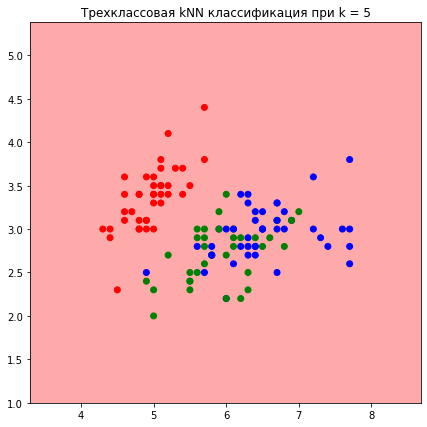

In [39]:
get_graph(X_train, y_train, k)

**2*. Написать функцию подсчета метрики качества кластеризации как среднее квадратичное внутриклассовое расстояние и построить график ее зависимости от количества кластеров k (взять от 1 до 10) для выборки данных из данного урока (создать датасет, как в методичке).**